In [1]:
import xarray as xr
import matplotlib
from matplotlib import pyplot as plt, animation
from dask.distributed import Client
import cartopy.crs as ccrs
import numpy as np
from IPython.display import HTML, display
import folium


In [2]:
client = Client(n_workers=32, memory_limit="8GB")

In [3]:
path = "s3://yuvipanda-test1/cmr-test/gpm3imerghhl-3059ffe1f79a5aa4dda36ae7d548b01b31d73baafcba14205e0b07193330a394-1663957130/"
ds = xr.open_dataset(path, engine="zarr", chunks={})
ds

<xarray.Dataset>
Dimensions:                    (time: 8149, lon: 3600, lat: 1800, nv: 2)
Coordinates:
  * lat                        (lat) float32 -89.95 -89.85 ... 89.85 89.95
  * lon                        (lon) float32 -179.9 -179.8 ... 179.9 179.9
  * time                       (time) object 2000-06-01 00:00:00 ... 2022-09-...
Dimensions without coordinates: nv
Data variables:
    HQprecipitation            (time, lon, lat) float32 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    HQprecipitation_cnt        (time, lon, lat) int8 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    HQprecipitation_cnt_cond   (time, lon, lat) int8 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    precipitationCal           (time, lon, lat) float32 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    precipitationCal_cnt       (time, lon, lat) int8 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    precipitationCal_cnt_cond  (time, lon, lat) int8 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    randomError                (time, lon, lat) float32 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    randomError_cnt            (time, lon, lat) int8 dask.array<chunksize=(10, 3600, 1800), meta=np.ndarray>
    time_bnds                  (time, nv) object dask.array<chunksize=(10, 2), meta=np.ndarray>
Attributes:
    BeginDate:       2000-06-01
    BeginTime:       00:00:00.000Z
    DOI:             10.5067/GPM/IMERGDL/DAY/06
    EndDate:         2000-06-01
    EndTime:         23:59:59.999Z
    FileHeader:      StartGranuleDateTime=2000-06-01T00:00:00.000Z;\nStopGran...
    InputPointer:    3B-HHR-L.MS.MRG.3IMERG.20000601-S000000-E002959.0000.V06...
    ProductionTime:  2019-08-07T19:51:27.150Z
    title:           GPM IMERG Late Precipitation L3 1 day 0.1 degree x 0.1 d...

### Basic spatial plotting
Select a variable and a time to create a spatial map.

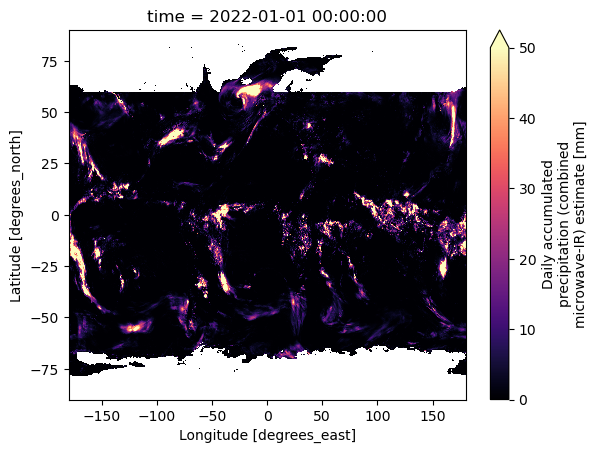

In [4]:
ds['precipitationCal'].sel(time = '2022-01-01').plot(x='lon',y='lat',cmap='magma',vmin=0, vmax=50)

### Basic temporal plotting 
Select a variable and a location. 
Recall that in the recipe we chunked data by time as the original files for this collection are one file for the whole globe per timestep. That makes the above plotting relatively easy if we're just selecting one time step, we're selecting one file from the cloud. However, to make time series plots like the following, we're accessing the nearly ~8200 files.

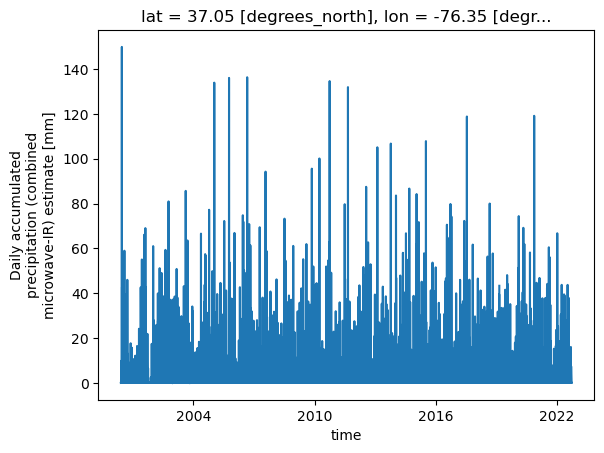

In [5]:
ds.precipitationCal.sel(lat=37.05, lon=-76.35,method = 'nearest').plot()

### More advanced data manipulations and visuals
Let's select a way to reaggregate the data... how about monthly sums for the year 2020 for one of the variables?

In [6]:
var = 'HQprecipitation'
target_year = 2020
ds_sample = ds[var].sel(time=ds.time.dt.year.isin([target_year])).groupby('time.month').sum()
ds_sample = ds_sample.transpose(ds_sample.dims[0],'lat','lon')
ds_sample

<xarray.DataArray 'HQprecipitation' (month: 12, lat: 1800, lon: 3600)>
dask.array<transpose, shape=(12, 1800, 3600), dtype=float32, chunksize=(1, 1800, 3600), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -89.95 -89.85 -89.75 -89.65 ... 89.75 89.85 89.95
  * lon      (lon) float32 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 179.9
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

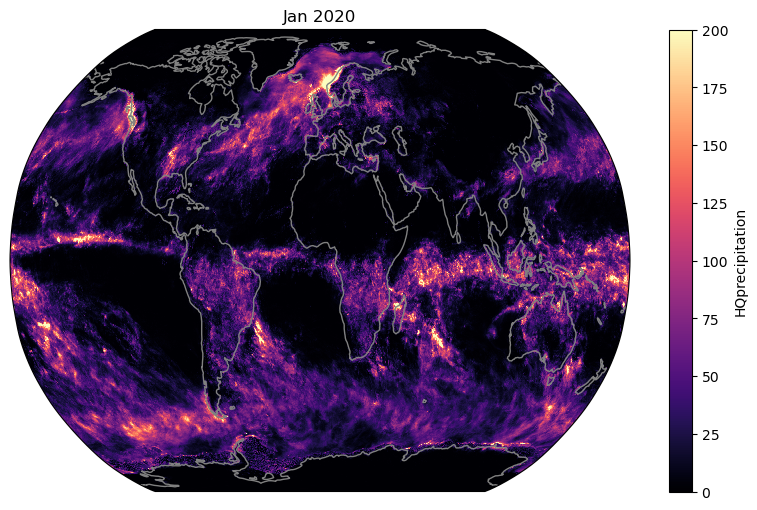

In [7]:
# Get a handle on the figure and the axes
#fig, ax = plt.subplots(projection=ccrs.Robinson(), aspect='auto',figsize=(12,6))
#ax = fig.add_subplot(111, projection=ccrs.Robinson(), aspect='auto')
month_name = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.Robinson(), aspect='auto')
# Plot the initial frame. 
cax = ds_sample[0,:,:].plot(
    transform=ccrs.PlateCarree(),
    add_colorbar=True,
    cmap='magma',
    vmin=0, vmax=200,
    cbar_kwargs={
        'extend':'neither'
    }
)

ax.coastlines(color='gray');

# Next we need to create a function that updates the values for the colormesh, as well as the title.
def animate(frame):
    temp = (ds_sample[frame,:,:])
    cax.set_array(temp.values.flatten())

    ax.set_title(month_name[frame] + ' ' + str(target_year))

# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames=12,       # Could also be iterable or list
    interval=200     # ms between frames
)

In [8]:
HTML(ani.to_jshtml())



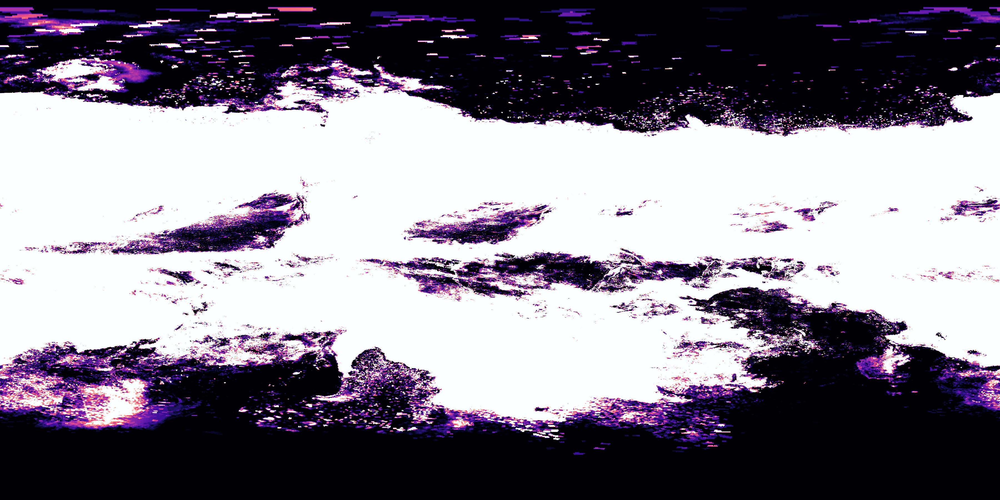

In [9]:



lon, lat = np.meshgrid(ds_sample.lon.values.astype(np.float64), ds_sample.lat.values.astype(np.float64))



m = folium.Map(location=[lat.mean(), lon.mean()], zoom_start=4,tiles="cartodbpositron",)
#for month in range(0,np.shape(ds_sample)[0]):
folium.raster_layers.ImageOverlay(ds_sample[0,:,:],
                     [[lat.min(), lon.min()], [lat.max(), lon.max()]],
                     colormap = matplotlib.colormaps['magma'],
                     #name= month_name[month] + ' ' + str(target_year),overlay=True,
                     mercator_project=True,
                     opacity=0.8).add_to(m)

#colormap.add_to(m)

m
